In [1]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt

## 随机数据

随机了两个二元正态分布，一个中心点在（0，0），y=0，一个在（1，4），y=1

In [2]:
np.random.seed(12)
num_observations = 5000

x1 = np.random.multivariate_normal([0, 0], [[1, .75],[.75, 1]], num_observations)
x2 = np.random.multivariate_normal([1, 4], [[1, .75],[.75, 1]], num_observations)

simulated_separableish_features = np.vstack((x1, x2)).astype(np.float32)
simulated_labels = np.hstack((np.zeros(num_observations),
                              np.ones(num_observations)))

In [3]:
simulated_separableish_features

array([[-0.2015173 , -0.6833582 ],
       [ 0.37451947, -0.8280822 ],
       [-0.16189468, -1.2471066 ],
       ...,
       [ 2.3255963 ,  4.181329  ],
       [ 0.24707289,  4.2294044 ],
       [ 1.7190224 ,  4.8253503 ]], dtype=float32)

In [4]:
simulated_labels

array([0., 0., 0., ..., 1., 1., 1.])

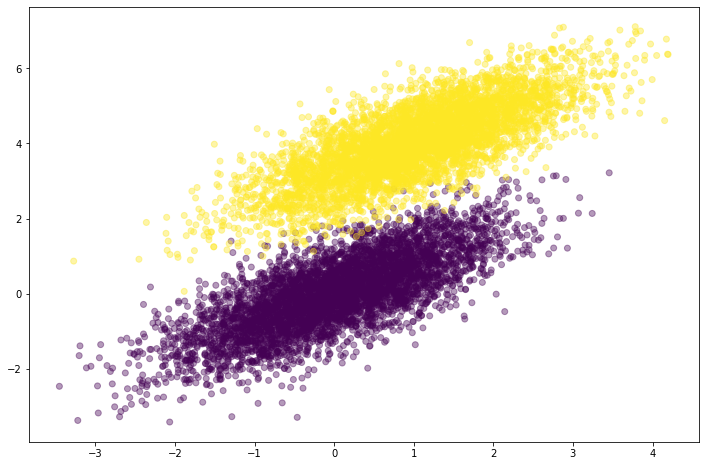

In [5]:
plt.figure(figsize=(12,8))
plt.scatter(simulated_separableish_features[:, 0], simulated_separableish_features[:, 1],
            c = simulated_labels, alpha = .4)

### 生成训练数据

In [6]:
X = np.column_stack((simulated_separableish_features,np.ones([simulated_separableish_features.shape[0],1])))
y = simulated_labels.reshape(X.shape[0],1)

## 逻辑回归

### 手写

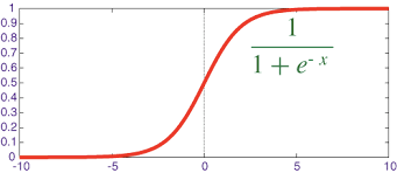

In [7]:
def sigmoid(x):
    return 1/(1+np.exp(-x))

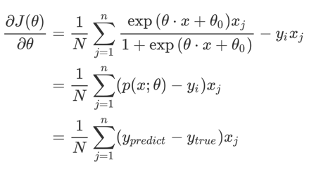

In [8]:
def gradient_loss_func(theta,X,y):
    N = X.shape[0]
    p = sigmoid(np.dot(X, theta))
    return 1/N*np.dot(X.transpose(), p-y)

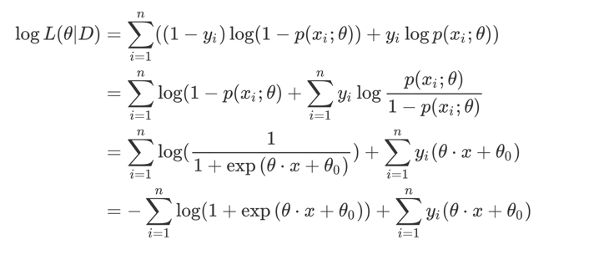

In [9]:
def log_likelihood(theta,X,y):
    N = X.shape[0]
    log_likelihood = 1/N *np.sum((np.dot(X, theta)*y) - np.log(np.exp(np.dot(X, theta))+1))
    return log_likelihood

In [10]:
def train(X,y,alpha=0.1, max_iter=10000):
    theta = np.zeros([X.shape[1],1])
    gradient = gradient_loss_func(theta,X,y)
    ll = log_likelihood(theta,X,y)
    theta_new = theta - alpha*gradient
    cnt = 1
    y_pre = predict(theta, X)
    acc = np.sum((y == y_pre).astype('int'))/y.shape[0]
    print("@ epoc={}: accuracy = {}, log likelihood = {}\n".format(cnt,acc, ll))
    ll_new = log_likelihood(theta_new,X,y)
    while abs(ll_new - ll) >= 10**-8 and cnt<max_iter:
        theta = theta_new
        ll = ll_new
        gradient = gradient_loss_func(theta,X,y)
        #print(gradient)
        theta_new = theta - alpha*gradient
        ll_new = log_likelihood(theta_new,X,y)
        cnt += 1
        y_pre = predict(theta, X)
        acc = np.sum((y == y_pre).astype('int'))/y.shape[0]
        print("@ epoc={}: accuracy = {}, log likelihood = {}\n".format(cnt,acc, ll))
    #print(theta_new)
    y_pre = predict(theta_new, X)
    acc = np.sum((y == y_pre).astype('int'))/y.shape[0]
    print("@ epoc={}: accuracy = {}, likelihood = {}\n".format(cnt,acc, ll))
    return theta_new

In [11]:
def predict(theta, X, threshold=0.5):
    p = sigmoid(np.dot(X, theta)) >= threshold
    return(p.astype('int'))

In [12]:
theta = train(X,y,alpha=0.01, max_iter=100000)

@ epoc=1: accuracy = 0.5, log likelihood = -0.6931471805599453

@ epoc=2: accuracy = 0.743, log likelihood = -0.6826602177183105

@ epoc=3: accuracy = 0.7433, log likelihood = -0.6726848807767185

@ epoc=4: accuracy = 0.7437, log likelihood = -0.6631942952164934

@ epoc=5: accuracy = 0.744, log likelihood = -0.6541625592888469

@ epoc=6: accuracy = 0.7446, log likelihood = -0.6455648019737168

@ epoc=7: accuracy = 0.7448, log likelihood = -0.6373772211120565

@ epoc=8: accuracy = 0.7456, log likelihood = -0.6295771043224699

@ epoc=9: accuracy = 0.7464, log likelihood = -0.6221428352383648

@ epoc=10: accuracy = 0.7472, log likelihood = -0.6150538874600397

@ epoc=11: accuracy = 0.7479, log likelihood = -0.6082908084295287

@ epoc=12: accuracy = 0.7486, log likelihood = -0.6018351952231679

@ epoc=13: accuracy = 0.7497, log likelihood = -0.5956696640325804

@ epoc=14: accuracy = 0.7504, log likelihood = -0.5897778148804004

@ epoc=15: accuracy = 0.7513, log likelihood = -0.584144192900

In [13]:
theta

array([[-2.73652174],
       [ 4.5825527 ],
       [-7.6440708 ]])

In [14]:
X = np.column_stack((simulated_separableish_features,np.ones([simulated_separableish_features.shape[0],1])))
y = simulated_labels.reshape(X.shape[0],1)

### scikit-learn包

In [15]:
from sklearn.linear_model import LogisticRegression

In [16]:
# Create an instance and fit the model 
lr_model = LogisticRegression()
X_train = simulated_separableish_features
y_train = simulated_labels
lr_model.fit(X_train, y_train)

# Making predictions
#y_pred_sk = lr_model.predict(X_test.values.reshape(-1, 1))

# plt.clf()
# plt.scatter(X_test, y_test)
# plt.scatter(X_test, y_pred_sk, c="red")
# plt.show()

# Accuracy
# accuracy = 0
# for i in range(len(y_pred)):
#     if y_pred[i] == y_test.iloc[i]:
#         accuracy += 1
# print(f"Accuracy = {accuracy / len(y_pred)}")

LogisticRegression()

In [17]:
lr_model.intercept_

array([-11.22203241])

In [18]:
lr_model.coef_

array([[-3.92166111,  6.57564025]])

In [19]:
lr_model.score(X =X_train, y= y_train)

0.9948

In [20]:
y_pre = lr_model.predict(X_train)

In [22]:
import seaborn as sns

In [23]:
X_train[:,0]

array([-0.2015173 ,  0.37451947, -0.16189468, ...,  2.3255963 ,
        0.24707289,  1.7190224 ], dtype=float32)

<AxesSubplot:>

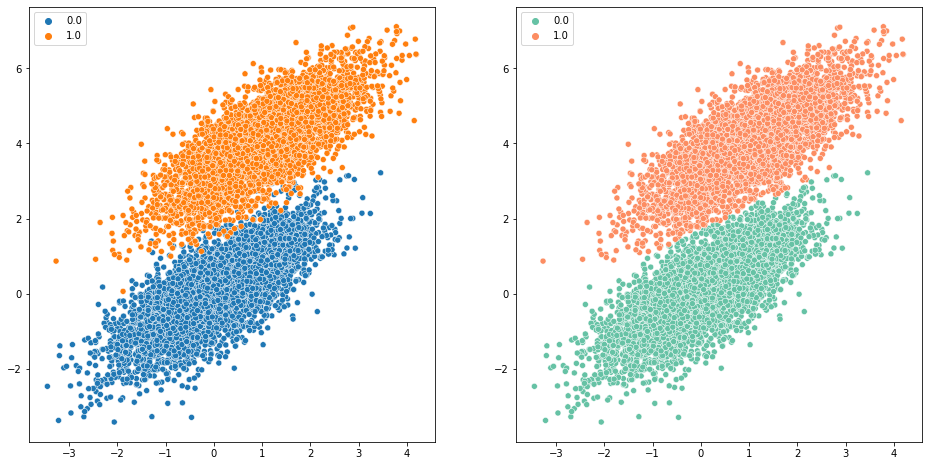

In [24]:
f, axs = plt.subplots(1, 2, figsize=(16, 8), gridspec_kw=dict(width_ratios=[3, 3]))
sns.scatterplot(x=X_train[:,0], y=X_train[:,1], hue=y_train, ax=axs[0])
sns.scatterplot(x=X_train[:,0], y=X_train[:,1], hue=y_pre, palette="Set2", ax=axs[1])